# **Advanced Lane Finding** 
***
TBD

In [1]:
#importing some useful packages
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import cv2
import glob
%matplotlib inline

## Step 1: Camera Calibration and Image Undistortion

In [2]:

# read in all the image file names 
imageFiles = glob.glob('camera_cal/calibration*.jpg') # imageFiles is a list of image file names (string)

# Arrays to store object points and image points
objPoints = []
imgPoints = []

#prepare object points, which are the same for every image
objp = np.zeros((6*9,3),np.float32) # 6*9 points, each with 3 coordinate values (x,y,z)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2) # the output would be [[0. 0. 0.] ... [8. 5. 0.]]
#print(objp)
# iterate through all the images 
for fileName in imageFiles:
    # read in the image 
    img = mpimg.imread(fileName)
    # convert image to gray scale
    gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
    # find the chess board corner points
    ret, corners = cv2.findChessboardCorners(gray, (9,6), None)
    # if corners are found, add object points and image points
    if ret == True:
        imgPoints.append(corners)
        objPoints.append(objp)
        #img = cv2.drawChessboardCorners(img, (9,6), corners, ret)
        #plt.imshow(gray,'gray')
        #plt.imshow(img)


In [3]:
# calibrate camera and obtain calibration coefficients
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objPoints, imgPoints, gray.shape[::-1], None, None)
# undistort image
#dst = cv2.undistort(img, mtx, dist, None, mtx)
#plt.imshow(dst)
#plt.show()

# create a function that undistort an image using the calibration coefficient we obtained above
def cal_undistort(img,mtx=mtx,dist=dist):
    # undistort image
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    # return the undistorted image
    return undist

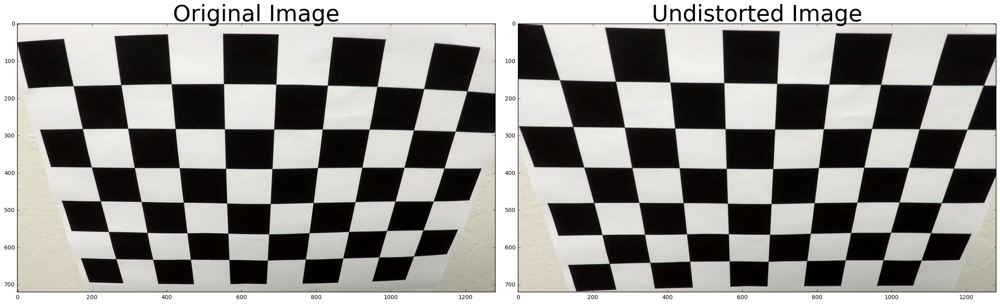

In [4]:
# read in a particular image to test our image distortion result
image = mpimg.imread('camera_cal/calibration2.jpg')
# plot the original and undistorted images side by side
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
# left image
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=40)
# right image
ax2.imshow(cal_undistort(image)) # call the cal_undistort function to undistort image
ax2.set_title('Undistorted Image', fontsize=40)

plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)


## Step 2: Edge Detection

---
Use color transforms, gradients, etc., to create a thresholded binary image.

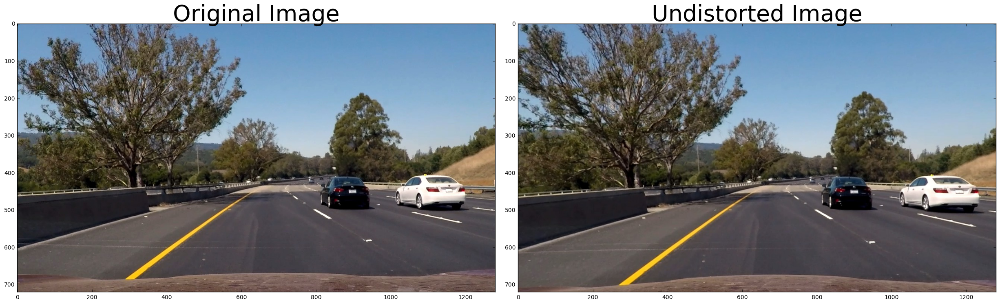

In [5]:
#
image = mpimg.imread('test_images/test6.jpg')
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
# left image
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=40)
# right image
ax2.imshow(cal_undistort(image)) # call the cal_undistort function to undistort image
ax2.set_title('Undistorted Image', fontsize=40)

plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

Implement three types of gradient-based edge detection function:

1) directional gradient: abs_sobel_thresh(...) 

2) gradient magnitude  : mag_thresh(...)

3) gradient direction  : dir_threshold(...)

In [6]:
def abs_sobel_thresh(img, orient='x', sobel_kernel=3, thresh=(0, 255)):
    
    #################################
    # Calculate directional gradient
    #################################
    
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
    
    # 2) Take the derivative in x or y given orient = 'x' or 'y'
    
    if (orient == 'x'):
        sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize = sobel_kernel)
    
    if (orient == 'y'):
        sobel = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize = sobel_kernel)
    
    # 3) Take the absolute value of the derivative or gradient
    sobel_abs = np.absolute(sobel)
    
    # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
    sobelAbsScale = np.uint8(sobel_abs/np.max(sobel_abs)*255)
    
    ##################
    # Apply threshold
    ##################
    
    # 5) Create a mask of 1's where the scaled gradient magnitude 
            # is > thresh_min and < thresh_max
    grad_binary = np.zeros_like(sobelAbsScale)
    grad_binary[(sobelAbsScale > thresh[0]) & (sobelAbsScale < thresh[1])] = 1
    
    # 6) Return this mask as your binary_output image
        
    return grad_binary


In [7]:
def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    
    ###############################
    # Calculate gradient magnitude
    ###############################
        
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
    
    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    
    # 3) Calculate the magnitude 
    abs_sobelxy = np.sqrt(sobelx*sobelx + sobely*sobely)
    
    # 4) Scale to 8-bit (0 - 255) and convert to type = np.uint8
    sobel_scale = np.uint8(abs_sobelxy/np.max(abs_sobelxy)*255)
    
    ##################
    # Apply threshold
    ##################
    # 5) Create a binary mask where mag thresholds are met
    mag_binary = np.zeros_like(sobel_scale)
    mag_binary[ (sobel_scale > mag_thresh[0]) & (sobel_scale < mag_thresh[1])] = 1
    
    # 6) Return this mask as your binary_output image
      
    return mag_binary


In [8]:
def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    
    ###############################
    # Calculate gradient direction
    ###############################
        
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
    
    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize = sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize = sobel_kernel)
    
    # 3) Take the absolute value of the x and y gradients
    abs_sobelx = np.absolute(sobelx)
    abs_sobely = np.absolute(sobely)
    
    # 4) Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient 
    grad_dir = np.arctan2(abs_sobely, abs_sobelx)
    
    ##################
    # Apply threshold
    ##################
    
    # 5) Create a binary mask where direction thresholds are met
    dir_binary = np.zeros_like(grad_dir)
    dir_binary[(grad_dir > thresh[0]) & (grad_dir < thresh[1])] = 1
    
    # 6) Return this mask as your binary_output image
        
    return dir_binary

Implement one hls color space based edge detection function

In [9]:
def hls_select(img, thresh=(0, 255)):
    
    # 1) Convert to HLS color space
    hls = cv2.cvtColor(img,cv2.COLOR_RGB2HLS)
    S = hls[:,:,2]
    
    # 2) Apply a threshold to the S channel
    hls_binary = np.zeros_like(S)
    hls_binary[(S > thresh[0]) & (S <= thresh[1])] = 1
    
    # 3) Return a binary image of threshold result    
    return hls_binary
    

Now combine the gradient-based and hls-based edge detection

In [10]:
def edge_detection(image):
    
    # Choose a larger odd number to smooth gradient measurements
    ksize = 11 
    
    # Apply each of the thresholding functions
    gradx = abs_sobel_thresh(image, orient='x', sobel_kernel=ksize, thresh=(30, 120))
    grady = abs_sobel_thresh(image, orient='y', sobel_kernel=ksize, thresh=(30, 120))
    mag_binary = mag_thresh(image, sobel_kernel=ksize, mag_thresh=(50, 150))
    dir_binary = dir_threshold(image, sobel_kernel=ksize, thresh=(0.7, 1.4))
    hls_binary = hls_select(image,thresh=(120, 255))

    # combine
    combined = np.zeros_like(dir_binary)
    combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1)) | (hls_binary == 1)] = 1
    #combined[(hls_binary == 1)] = 1
    return combined

<class 'numpy.ndarray'>


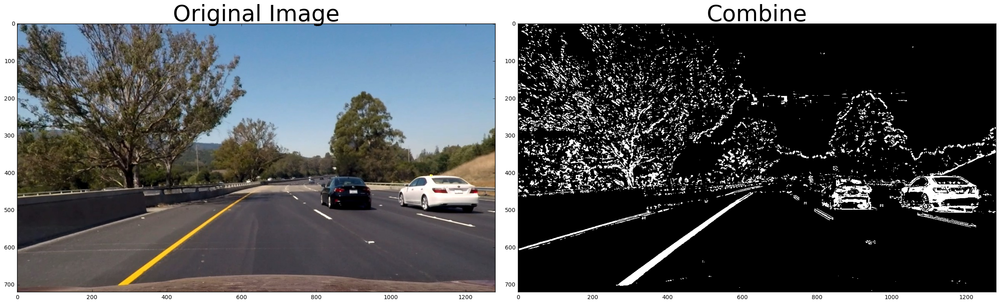

[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
255
<class 'numpy.ndarray'>
(720, 1280, 3)


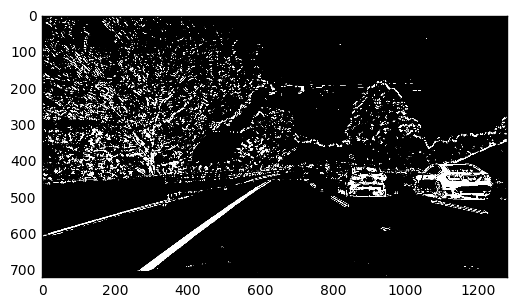

In [11]:
# Read in an image
img = mpimg.imread('test_images/test6.jpg')
image = cal_undistort(img)
# Choose a Sobel kernel size

combined = edge_detection(image)
hls_edge = hls_select(image,thresh=(140, 255))
print(type(combined))
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(image)
ax1.set_title('Original Image', fontsize=40)

ax2.imshow(combined, cmap='gray')
ax2.set_title('Combine', fontsize=40)

plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.show()

print(combined[600,350:400])
test_img = np.dstack((combined, combined, combined))*255
test_img = test_img.astype(np.uint8)
print(np.max(test_img))
print(type(test_img))
print(test_img.shape)
plt.imshow(test_img)

In [12]:
# define the function to mask the regions that are not of interest to us
def region_of_interest(img, vertices):
    """
    Applies an image mask.
    
    Only keeps the region of the image defined by the polygon
    formed from `vertices`. The rest of the image is set to black.
    """
    #defining a blank mask to start with
    mask = np.zeros_like(img)   
    
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (1,) * channel_count
    else:
        ignore_mask_color = 1
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image


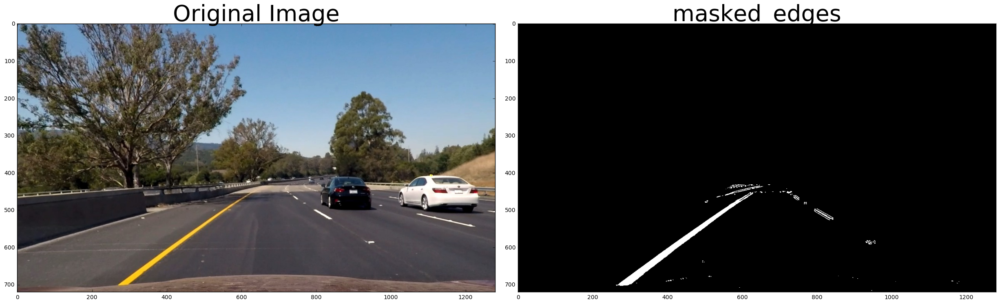

1.0
255.0
[83 85 85 84 85 85 85 84 83 82 83 83 84 81 85 81 83 83 84 83 84 84 84 84 84
 83 81 81 80 80 79 79 77 78 79 80 82 83 81 78 78 79 80 78 76 77 81 84 81 78]
[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]


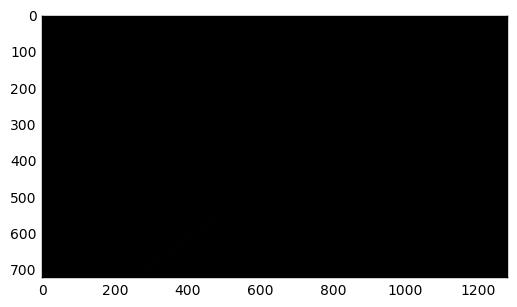

In [13]:

# now section out only the region of interest for our edge image
imshape = combined.shape
vertices = np.array([[(100,imshape[0]),(imshape[1]*0.5*0.9, imshape[0]*0.6), (imshape[1]*0.5*1.1, imshape[0]*0.6), (imshape[1]-50,imshape[0])]], dtype=np.int32)
masked_edges = region_of_interest(combined, vertices)

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(image)
ax1.set_title('Original Image', fontsize=40)

ax2.imshow(masked_edges, cmap='gray')
ax2.set_title('masked_edges', fontsize=40)

plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.show()

print(np.max(masked_edges))

test_img = np.dstack((masked_edges, masked_edges, masked_edges))*255
print(np.max(test_img))
plt.imshow(test_img)

print(image[600,350:400,1])
print(test_img[600,350:400,1])


## Step 3: Perspective Transform

---
Apply a perspective transform to rectify binary image ("birds-eye view").

[[  585.           460.        ]
 [  203.33332825   720.        ]
 [ 1111.66662598   720.        ]
 [  705.           460.        ]]
[1280, 720]


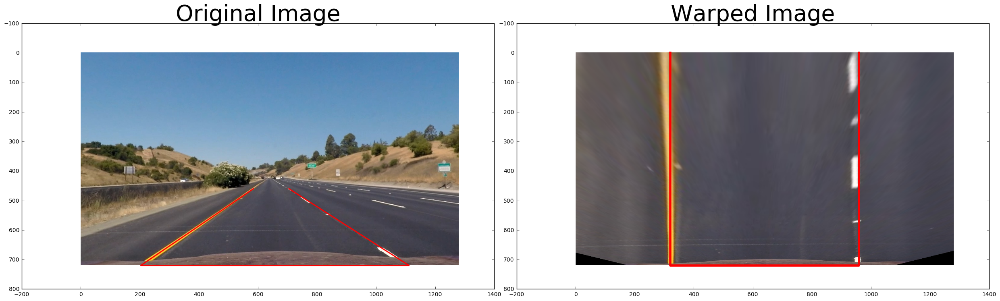

In [14]:
image = mpimg.imread('test_images/straight_lines1.jpg')
img = cal_undistort(image)
img_size = [img.shape[1],img.shape[0]]

# hard coded source points and destination points
src = np.float32(
    [[(img_size[0] / 2) - 55, img_size[1] / 2 + 100],
    [((img_size[0] / 6) - 10), img_size[1]],
    [(img_size[0] * 5 / 6) + 45, img_size[1]],
    [(img_size[0] / 2 + 65), img_size[1] / 2 + 100]])
dst = np.float32(
    [[(img_size[0] / 4), 0],
    [(img_size[0] / 4), img_size[1]],
    [(img_size[0] * 3 / 4), img_size[1]],
    [(img_size[0] * 3 / 4), 0]])

print(src)
#img_size.append(3)
print(img_size)

M = cv2.getPerspectiveTransform(src, dst)
Minv = cv2.getPerspectiveTransform(dst, src)
warped = cv2.warpPerspective(img, M, (img_size[0],img_size[1]), flags=cv2.INTER_LINEAR)

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(img)
ax1.plot((src[:,0]),(src[:,1]), linewidth=2, color='r')
ax1.set_title('Original Image', fontsize=40)

ax2.imshow(warped)
ax2.plot((dst[:,0]),(dst[:,1]), linewidth=4, color='r')
ax2.set_title('Warped Image', fontsize=40)

plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.show()




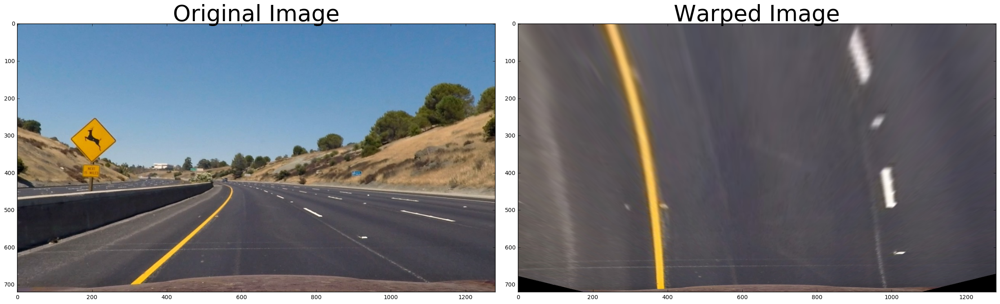

In [15]:
# apply perspective transform on a test image

image = mpimg.imread('test_images/test2.jpg')
img = cal_undistort(image)
img_size = [img.shape[1],img.shape[0]]

warped = cv2.warpPerspective(img, M, (img_size[0],img_size[1]), flags=cv2.INTER_LINEAR)

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(img)
ax1.set_title('Original Image', fontsize=40)

ax2.imshow(warped)
ax2.set_title('Warped Image', fontsize=40)

plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.show()

(720, 1280)
float64
1.0


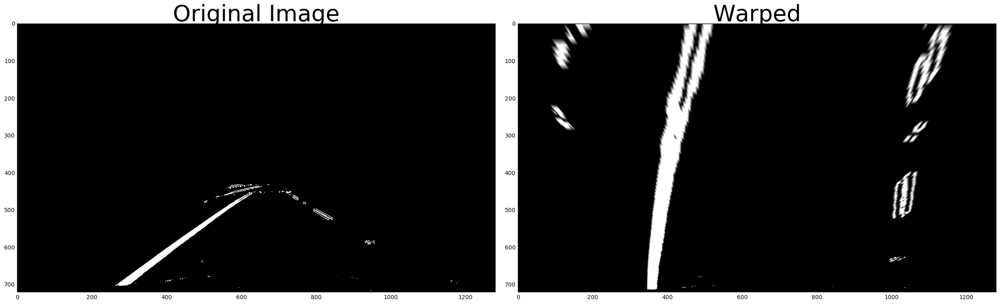

In [16]:
# apply perspective transform on an edge image

warped = cv2.warpPerspective(masked_edges, M, (img_size[0],img_size[1]), flags=cv2.INTER_LINEAR)
print(warped.shape)
print(warped.dtype)
print(np.max(warped))
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(masked_edges, cmap='gray')
ax1.set_title('Original Image', fontsize=40)

ax2.imshow(warped, cmap='gray')
ax2.set_title('Warped', fontsize=40)

plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.show()

## Step 4: Lane Marker Identification and Fitting

---
Detect lane pixels and fit to find the lane boundary.

In [17]:
def laneFind_BoxMethod(binary_warped,visual = False):
    #binary_warped = warped.astype(np.uint8) # convert float dtype to uint8
    
    # Assuming you have created a warped binary image called "binary_warped"
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255

    #print(out_img.dtype)
    #out_img = out_img.astype(np.uint8) # convert float dtype to uint8, otherwise the image is not shown properly

    plt.imshow(out_img)
    print(np.max(out_img))
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero() # this is a tuple
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    # visualization
    if(visual == True):
        ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

        out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
        out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
        plt.imshow(out_img)
        plt.plot(left_fitx, ploty, color='yellow')
        plt.plot(right_fitx, ploty, color='yellow')
        plt.xlim(0, 1280)
        plt.ylim(720, 0)
    
    return [left_fit,right_fit,leftx,lefty,rightx,righty]


In [18]:
def laneFind_BaseMethod(binary_warped):

    global laneCoeffFltr_left
    global laneCoeffFltr_right
    
    # Assume you now have a new warped binary image 
    # from the next frame of video (also called "binary_warped")
    # It's now much easier to find line pixels!
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 100
    left_lane_inds = ((nonzerox > (laneCoeffFltr_left[0]*(nonzeroy**2) + laneCoeffFltr_left[1]*nonzeroy + laneCoeffFltr_left[2] - margin)) & (nonzerox < (laneCoeffFltr_left[0]*(nonzeroy**2) + laneCoeffFltr_left[1]*nonzeroy + laneCoeffFltr_left[2] + margin))) 
    right_lane_inds = ((nonzerox > (laneCoeffFltr_right[0]*(nonzeroy**2) + laneCoeffFltr_right[1]*nonzeroy + laneCoeffFltr_right[2] - margin)) & (nonzerox < (laneCoeffFltr_right[0]*(nonzeroy**2) + laneCoeffFltr_right[1]*nonzeroy + laneCoeffFltr_right[2] + margin)))  

    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    return [left_fit, right_fit, leftx, lefty, rightx, righty]

255
[  1.56764077e-04  -2.97759426e-01   4.90562744e+02]
[  3.30353640e-04  -3.83173110e-01   1.13579922e+03]
645.236477888


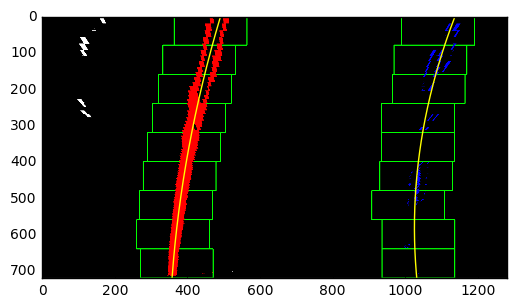

In [19]:
binary_warped = warped.astype(np.uint8) # convert float dtype to uint8

# Generate x and y values for plotting

[left_fit,right_fit,leftx,lefty,rightx,righty] = laneFind_BoxMethod(binary_warped,visual = True)

print(left_fit)
print(right_fit)
left_fit.dtype
print(right_fit[2]-left_fit[2])

In [20]:
def curveRad(img_size,left_fit,right_fit):
    
    ploty = np.linspace(0, img_size[0]-1, img_size[0] )

    leftx = np.array([left_fit[0]*y**2 + left_fit[1]*y + left_fit[2] + np.random.randint(-50, high=51) 
                                  for y in ploty])
    rightx = np.array([right_fit[0]*y**2 + right_fit[1]*y + right_fit[2] + np.random.randint(-50, high=51) 
                                  for y in ploty])

    leftx = leftx[::-1]  # Reverse to match top-to-bottom in y
    rightx = rightx[::-1]  # Reverse to match top-to-bottom in y

    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension


    y_eval = np.max(ploty)
    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(ploty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, rightx*xm_per_pix, 2)
    # Calculate the new radii of curvature
    left_curverad  = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    
    ave_fit_cr     = ( left_fit_cr + right_fit_cr ) / 2
    ave_curverad   = ((1 + (2*ave_fit_cr[0]*y_eval*ym_per_pix + ave_fit_cr[1])**2)**1.5) / np.absolute(2*ave_fit_cr[0])
    # Now our radius of curvature is in meters
    #print(left_curverad, 'm', right_curverad, 'm')
    
    return [left_curverad,right_curverad,ave_curverad]

In [21]:
img_size = binary_warped.shape
[left_curverad,right_curverad,ave_curverad] = curveRad(img_size,left_fit,right_fit)
print(left_curverad,right_curverad,ave_curverad)

1129.66039569 554.935571646 744.074229939


## Step 5: Lane Line Filtering

In [22]:
#

def sanity_check(fit, flt_fit):
    curvThresh = 0.01
    hdngThresh = 0.3
    offsetThresh = 100
    
    if ( (np.abs(fit[0]-flt_fit[0]) > curvThresh) | (np.abs(fit[1]-flt_fit[1]) > hdngThresh) | (np.abs(fit[2]-flt_fit[2]) > offsetThresh)):
        return False
    else:
        return True

def sanity_check_lr(left_fit,right_fit):
    curvThresh = 0.1
    hdngThresh = 0.5    
    MinLnWd    = 600
    MaxLnWd    = 800
    
    if ( (np.abs(left_fit[0]-right_fit[0]) > curvThresh) | (np.abs(left_fit[1]-right_fit[1]) > hdngThresh)
          | (right_fit[2] - left_fit[2] > MaxLnWd) | (right_fit[2] - left_fit[2] < MinLnWd ) ):
        return False
    else:
        return True

## Step 6: Perspective Transform onto Original Image

In [23]:
#

    

def persInvTrans(undist,warped,left_fit,right_fit,leftx,lefty,rightx,righty):
    
    img_size = warped.shape
    ploty      = np.linspace(0, img_size[0]-1, img_size[0] )
    left_fitx  = left_fit[0] *ploty**2 + left_fit[1]*ploty  + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
        
    #color_warp[lefty, leftx] = [255, 0, 0]
    #color_warp[righty, rightx] = [0, 0, 255]
    
    cv2.polylines(color_warp,  np.int32(pts_left), 0 , color=(255,0,0),thickness=15)
    cv2.polylines(color_warp,  np.int32(pts_right), 0 , color=(0,0,255),thickness=15)
    
    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (img_size[1], img_size[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(undist, 1, newwarp, 0.3, 0)
    
    return result
    #plt.imshow(result)

## Step 7: Combine

In [24]:
def laneOffset(img_size,left_fit,right_fit):
    
    yMax = img_size[0]
    midPoint = img_size[1]/2
    
    #ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    
    left_offset  = left_fit[0] *yMax**2 + left_fit[1]*yMax  + left_fit[2]
    right_offset = right_fit[0]*yMax**2 + right_fit[1]*yMax + right_fit[2]
    
    offset = (left_offset + right_offset)/2 - midPoint
    #print(yMax,midPoint)
    
    return (offset*xm_per_pix)


In [25]:

# global variables:

curvRad_filtr = 1000
lnOffset_filtr = 0
filtr_coeff = 0.1
laneCoeffFltr_left = np.array([0, 0, 300])
laneCoeffFltr_right = np.array([0, 0, 1000])
checkFail_count = 100
print(curvRad_filtr)

def LaneFinding_Pipeline(img):
    
    global curvRad_filtr
    global lnOffset_filtr
    global laneCoeffFltr_left
    global laneCoeffFltr_right
    global checkFail_count
    
    countThresh = 20
    reset = False 
    # 1) undistort image
    img_undistort = cal_undistort(img) 
    
    # 2) do edge detection
    img_edge      = edge_detection(img_undistort)
    
    # 3) perspective transform
    img_size = [img_edge.shape[1],img_edge.shape[0]]
    img_warped    = cv2.warpPerspective(img_edge, M, (img_size[0],img_size[1]), flags=cv2.INTER_LINEAR)
    
    # 4) find the lane
    binary_warped = img_warped.astype(np.uint8) # convert float dtype to uint8
    
    if (checkFail_count > countThresh):
        # reset lane coefficient
        [left_fit, right_fit, leftx, lefty, rightx, righty] = laneFind_BoxMethod(binary_warped,visual = True)
        if sanity_check_lr(left_fit,right_fit):
            checkFail_count = 0
            laneCoeffFltr_left = left_fit
            laneCoeffFltr_right = right_fit
            reset = True
        
    else:
        [left_fit, right_fit, leftx, lefty, rightx, righty] = laneFind_BaseMethod(binary_warped)
        # sanity check left
        sanChecked = sanity_check(left_fit,laneCoeffFltr_left)
        if sanChecked:
            # lane filtering/smoothing
            laneCoeffFltr_left = filtr_coeff * left_fit + (1-filtr_coeff) * laneCoeffFltr_left    
            checkFail_count += -0.1
            if checkFail_count < 0:
                checkFail_count = 0
        else:
            checkFail_count += 1   
        # sanity check right
        sanChecked = sanity_check(right_fit,laneCoeffFltr_right)
        if sanChecked:
            laneCoeffFltr_right = filtr_coeff * right_fit + (1-filtr_coeff) * laneCoeffFltr_right
            checkFail_count += -0.1
            if checkFail_count < 0:
                checkFail_count = 0
        else:
            checkFail_count += 1
        
        #[left_fit,right_fit,leftx,lefty,rightx,righty] = laneFind_BoxMethod(binary_warped,visual = True)
        
    # 5) calc curve radius
    img_size = binary_warped.shape
    [left_curverad,right_curverad,ave_curverad] = curveRad(img_size,laneCoeffFltr_left,laneCoeffFltr_right)
    #curvRad_filtr = filtr_coeff *ave_curverad  + (1-filtr_coeff) * curvRad_filtr
    
    # 7) perspective transform back 
    warped_back = persInvTrans(img_undistort,binary_warped,laneCoeffFltr_left,laneCoeffFltr_right,leftx,lefty,rightx,righty)
    
    
    offset = laneOffset(img_size,left_fit,right_fit)
    lnOffset_filtr =  offset * filtr_coeff + (1-filtr_coeff) * lnOffset_filtr
      
    # 8) overlay the calculated radius and lane offset
    txt = 'Curve Radius: {:5.0f} (m)'.format(ave_curverad)
    cv2.putText(warped_back,txt, (200,100),cv2.FONT_HERSHEY_SIMPLEX , 2 ,(255,255,255),4, lineType = cv2.LINE_AA)
    
    txt2 = 'lane offset: {:.2f} (m)'.format(lnOffset_filtr)
    cv2.putText(warped_back,txt2, (200,200),cv2.FONT_HERSHEY_SIMPLEX , 2 ,(255,255,255),4, lineType = cv2.LINE_AA)
    
    # debug purpose
    debug = False
    if debug:     
        txt_color = (0,0,255)
        txt_loc   = (800,400)
        txt_font  = 1
        if reset:
            txt3 = 'reset:{:.1f}'.format(laneCoeffFltr_right[2]-laneCoeffFltr_left[2])            
            print(laneCoeffFltr_right[2]-laneCoeffFltr_left[2])
            txt_loc = (800,300)
            txt_font = 2
        else:
            txt3 = 'checkFail_count: {:.1f}'.format(checkFail_count)  
            if checkFail_count > countThresh:
                txt_color = (255,0,0)
        cv2.putText(warped_back,txt3, txt_loc,cv2.FONT_HERSHEY_SIMPLEX , txt_font , txt_color, 4, lineType = cv2.LINE_AA)
    
    # return [warped_back,left_fit,right_fit,left_curverad,right_curverad]
    return warped_back

1000


255
uint8


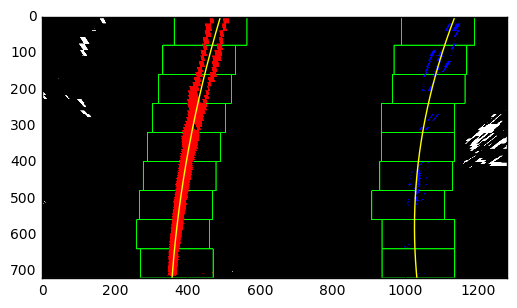

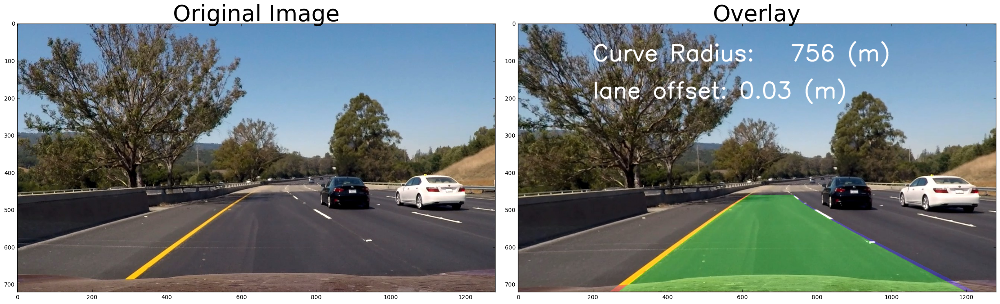

In [26]:
img = mpimg.imread('test_images/test6.jpg')

result_img = LaneFinding_Pipeline(img)

print(result_img.dtype)
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(img, cmap='gray')
ax1.set_title('Original Image', fontsize=40)

ax2.imshow(result_img, cmap='gray')
ax2.set_title('Overlay', fontsize=40)

plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.show()

#print(left_curverad, 'm', right_curverad, 'm')

## Step 8: Video Output

In [27]:
#
from moviepy.editor import VideoFileClip
from IPython.display import HTML



[MoviePy] >>>> Building video project_video_output.mp4
[MoviePy] Writing video project_video_output.mp4


  1%|          | 10/1261 [00:02<04:52,  4.27it/s]

255


 20%|█▉        | 252/1261 [01:00<04:02,  4.16it/s]

255


 20%|██        | 253/1261 [01:00<04:16,  3.92it/s]

255


100%|█████████▉| 1260/1261 [05:03<00:00,  3.75it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_output.mp4 

Wall time: 5min 4s


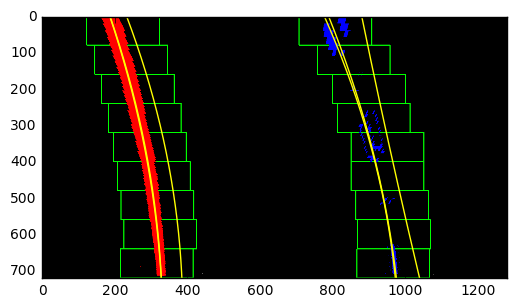

In [28]:
video_name = 'project_video'
white_output = video_name + '_output.mp4'
clip1 = VideoFileClip(video_name+'.mp4')
white_clip = clip1.fl_image(LaneFinding_Pipeline) #NOTE: this function expects color images!!
%time white_clip.write_videofile(white_output, audio=False)

In [29]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(white_output))